In [1]:
import tensorflow as tf

In [ ]:
# Creates a graph.
with tf.device('/gpu:0'):
  a = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[2, 3], name='a')
  b = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[3, 2], name='b')
c = tf.matmul(a, b)
# Creates a session with log_device_placement set to True.
sess = tf.Session(config=tf.ConfigProto(log_device_placement=True))
# Runs the op.
print(sess.run(c))

In [ ]:
import keras
keras.backend.backend()

In [ ]:
import numpy as np
from keras.layers import Add, Dense
from keras.models import Input, Model


import keract
def print_names_and_shapes(activations: dict):
    for layer_name, layer_activations in activations.items():
        print(layer_name)
        print(layer_activations.shape)
        print('')
    print('-' * 80)


def print_names_and_values(activations: dict):
    for layer_name, layer_activations in activations.items():
        print(layer_name)
        print(layer_activations)
        print('')
    print('-' * 80)


def get_multi_inputs_model():
    a = Input(shape=(10,))
    b = Input(shape=(10,))
    c = Add()([a, b])
    c = Dense(1, activation='sigmoid', name='last_layer')(c)
    m_multi = Model(inputs=[a, b], outputs=c)
    return m_multi


def get_single_inputs_model():
    inputs = Input(shape=(10,))
    x = Dense(1, activation='sigmoid')(inputs)
    m_single = Model(inputs=[inputs], outputs=x)
    return m_single


if __name__ == '__main__':
    np.random.seed(123)
    inp_a = np.random.uniform(size=(5, 10))
    inp_b = np.random.uniform(size=(5, 10))
    out_c = np.random.uniform(size=(5, 1))

    # Just for visual purposes.
    np.set_printoptions(precision=2)

    # Activations of all the layers
    print('MULTI-INPUT MODEL')
    m1 = get_multi_inputs_model()
    m1.compile(optimizer='adam', loss='mse')
    print_names_and_values(keract.get_activations(m1, [inp_a, inp_b]))
    print_names_and_values(keract.get_gradients_of_trainable_weights(m1, [inp_a, inp_b], out_c))
    print_names_and_values(keract.get_gradients_of_activations(m1, [inp_a, inp_b], out_c))

    # Just get the last layer!
    print_names_and_values(keract.get_activations(m1, [inp_a, inp_b], layer_name='last_layer'))
    print_names_and_values(keract.get_gradients_of_activations(m1, [inp_a, inp_b], out_c,
                                                                     layer_name='last_layer'))
    print('')

    print('SINGLE-INPUT MODEL')
    m2 = get_single_inputs_model()
    m2.compile(optimizer='adam', loss='mse')
    print_names_and_values(keract.get_activations(m2, inp_a))
    print_names_and_values(keract.get_gradients_of_trainable_weights(m2, inp_a, out_c))
    print_names_and_values(keract.get_gradients_of_activations(m2, inp_a, out_c))

In [1]:
from __future__ import print_function
%matplotlib
import os
from glob import glob

import keras
from keras.callbacks import ModelCheckpoint
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Flatten
from keras.models import Sequential

import keract

# What this script does:
# - define the model
# - if no checkpoints are detected:
#   - train the model
#   - save the best model in checkpoints/
# - load the model from the best checkpoint
# - read the activations

import keras
from keras.datasets import mnist
def print_names_and_shapes(activations: dict):
    for layer_name, layer_activations in activations.items():
        print(layer_name)
        print(layer_activations.shape)
        print('')
    print('-' * 80)


def print_names_and_values(activations: dict):
    for layer_name, layer_activations in activations.items():
        print(layer_name)
        print(layer_activations)
        print('')
    print('-' * 80)
# input image dimensions
img_rows, img_cols = 28, 28
input_shape = (img_rows, img_cols, 1)
num_classes = 10


def get_mnist_data():
    # the data, shuffled and split between train and test sets
    (x_train, y_train), (x_test, y_test) = mnist.load_data()

    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)

    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
    x_train /= 255
    x_test /= 255
    print('x_train shape:', x_train.shape)
    print(x_train.shape[0], 'train samples')
    print(x_test.shape[0], 'test samples')

    # convert class vectors to binary class matrices
    y_train = keras.utils.to_categorical(y_train, num_classes)
    y_test = keras.utils.to_categorical(y_test, num_classes)
    return x_train, y_train, x_test, y_test

if __name__ == '__main__':
    checkpoint_dir = 'checkpoints'

    checkpoints = glob(os.path.join(checkpoint_dir, '*.h5'))

    from keras.models import load_model

    if len(checkpoints) > 0:

        checkpoints = sorted(checkpoints)  # pip install natsort: natsorted() would be a better choice..
        assert len(checkpoints) != 0, 'No checkpoints found.'
        checkpoint_file = checkpoints[-1]
        print('Loading [{}]'.format(checkpoint_file))
        model = load_model(checkpoint_file)

        model.compile(optimizer='adam',
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])

        print(model.summary())

        x_train, y_train, x_test, y_test = get_mnist_data()

        # checking that the accuracy is the same as before 99% at the first epoch.
        # test_loss, test_acc = model.evaluate(x_test, y_test, verbose=0, batch_size=128)
        # print('')
        # assert test_acc > 0.98

        print_names_and_shapes(keract.get_activations(model, x_test[0:200]))  # with 200 samples.
        print_names_and_shapes(keract.get_gradients_of_trainable_weights(model, x_train[0:10], y_train[0:10]))
        print_names_and_shapes(keract.get_gradients_of_activations(model, x_train[0:10], y_train[0:10]))

        a = keract.get_activations(model, x_test[0:1])  # with just one sample.
        keract.display_activations(a)

        import numpy as np
        import matplotlib.pyplot as plt
        plt.imshow(np.squeeze(x_test[0:1]), interpolation='None', cmap='gray')
    else:
        x_train, y_train, x_test, y_test = get_mnist_data()

        model = Sequential()
        model.add(Conv2D(32, kernel_size=(3, 3),
                         activation='relu',
                         input_shape=input_shape))
        model.add(Conv2D(64, (3, 3), activation='relu'))
        model.add(MaxPooling2D(pool_size=(2, 2)))
        model.add(Dropout(0.25))
        model.add(Flatten())
        model.add(Dense(128, activation='relu'))
        model.add(Dropout(0.5))
        model.add(Dense(num_classes, activation='softmax'))

        model.compile(loss=keras.losses.categorical_crossentropy,
                      optimizer=keras.optimizers.Adadelta(),
                      metrics=['accuracy'])

        import shutil

        # delete folder and its content and creates a new one.
        if os.path.exists(checkpoint_dir):
            shutil.rmtree(checkpoint_dir)
        os.makedirs(checkpoint_dir)

        checkpoint = ModelCheckpoint(monitor='val_acc', save_best_only=True,
                                     filepath=os.path.join(checkpoint_dir, 'model_{epoch:02d}_{val_acc:.3f}.h5'))

        model.fit(x_train, y_train,
                  batch_size=128,
                  epochs=12,
                  verbose=1,
                  validation_data=(x_test, y_test),
                  callbacks=[checkpoint])

        score = model.evaluate(x_test, y_test, verbose=0)
        print('Test loss:', score[0])
        print('Test accuracy:', score[1])

Using matplotlib backend: TkAgg


Using TensorFlow backend.


Loading [checkpoints\model_11_0.992.h5]
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 26, 26, 32)        320       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 24, 24, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 9216)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               1179776   
_________________________________________________________________
dropout_2 (Dropout)          (None, 

Egyptian_cat (47.48033285140991)
input_4:0 (224, 224, 3) -> Skipped. First dimension is not 1.
block1_conv1_3/Relu:0 (1, 224, 224, 64) 


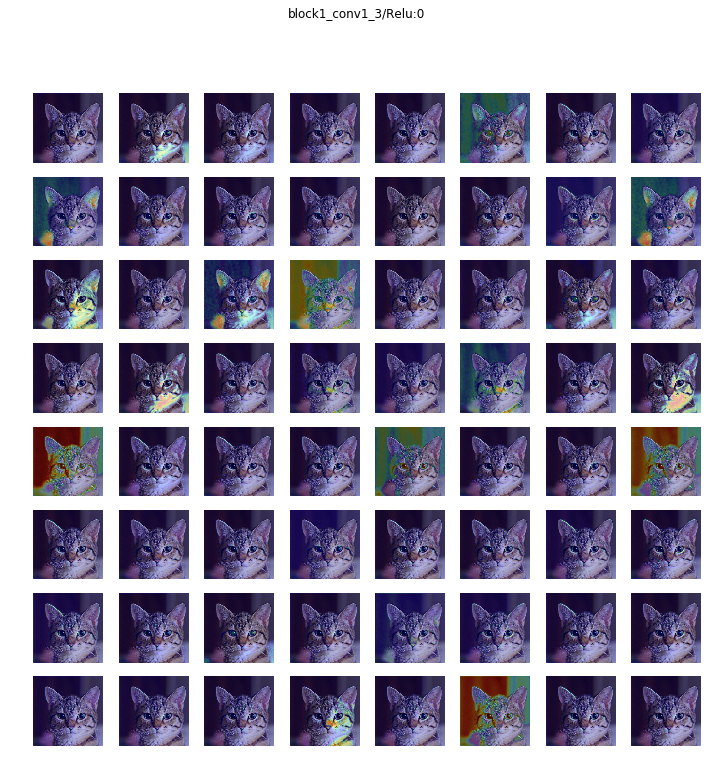

block1_conv2_3/Relu:0 (1, 224, 224, 64) 


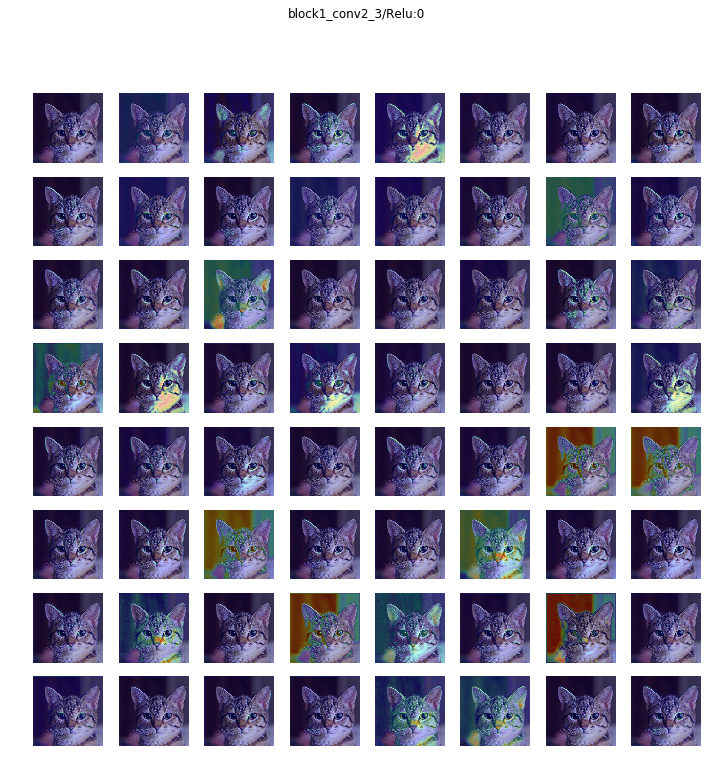

block1_pool_3/MaxPool:0 (1, 112, 112, 64) 


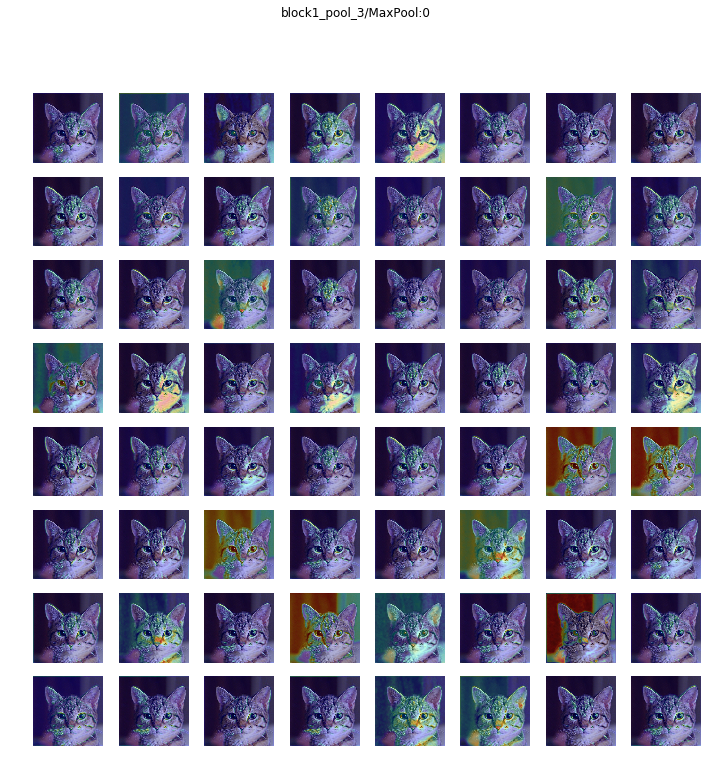

block2_conv1_3/Relu:0 (1, 112, 112, 128) 


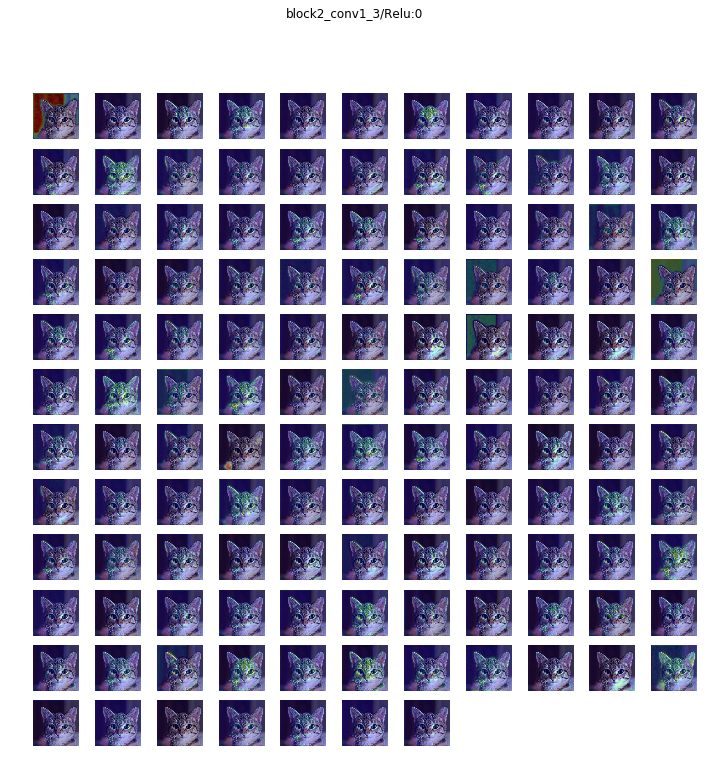

block2_conv2_3/Relu:0 (1, 112, 112, 128) 


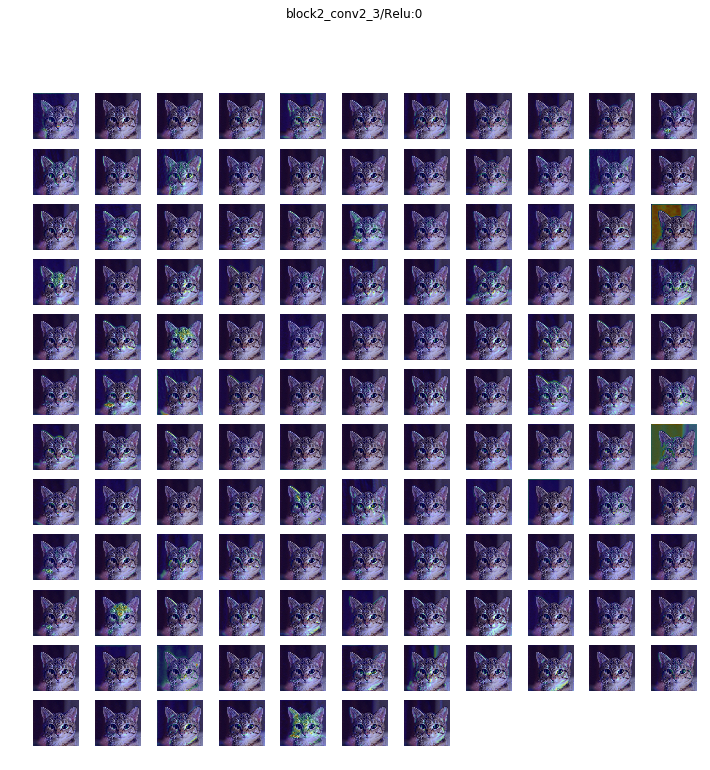

block2_pool_3/MaxPool:0 (1, 56, 56, 128) 


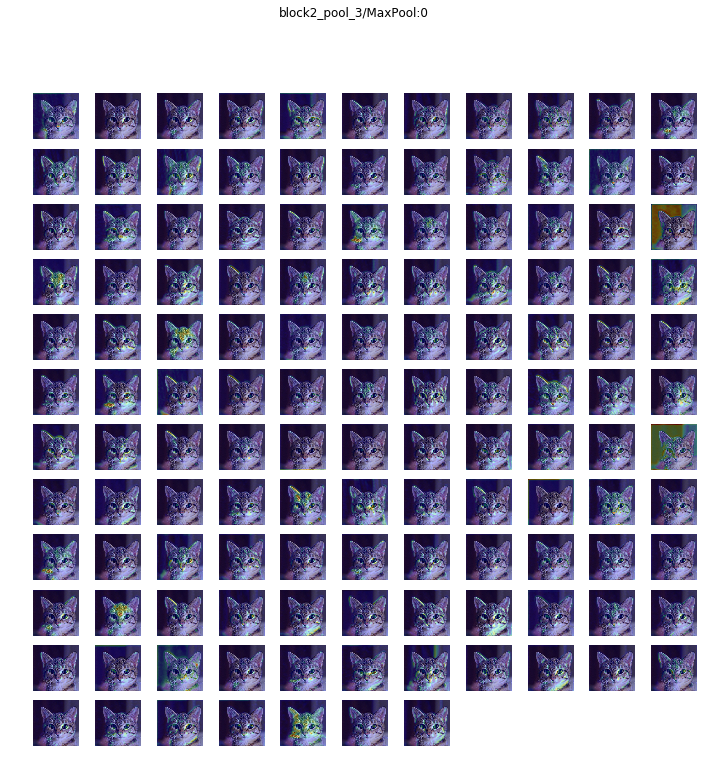

block3_conv1_3/Relu:0 (1, 56, 56, 256) 


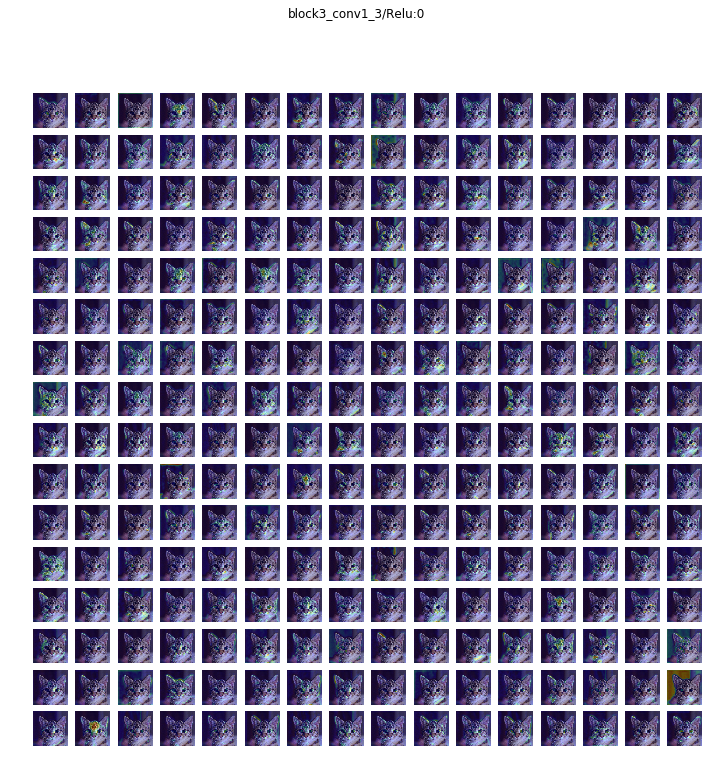

block3_conv2_3/Relu:0 (1, 56, 56, 256) 


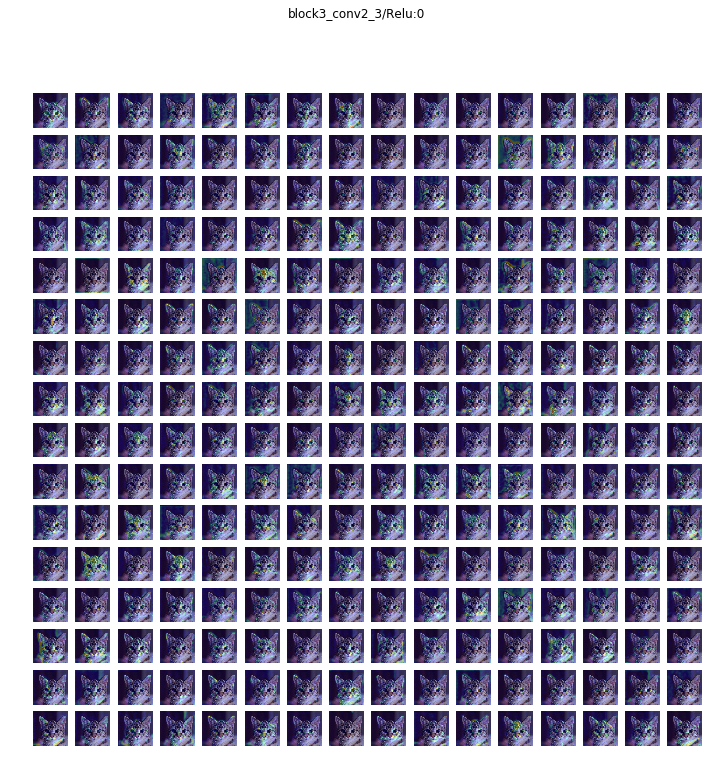

block3_conv3_3/Relu:0 (1, 56, 56, 256) 


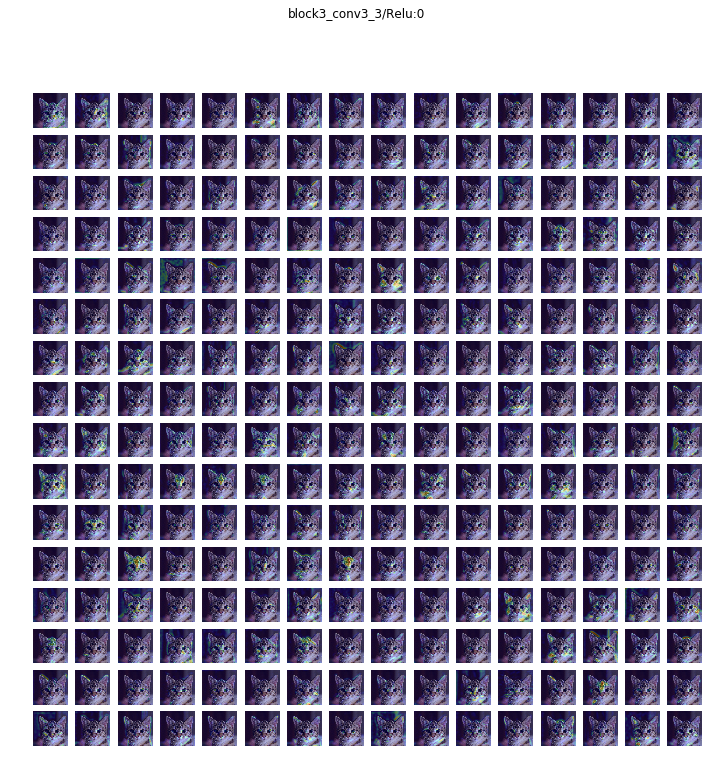

block3_pool_3/MaxPool:0 (1, 28, 28, 256) 


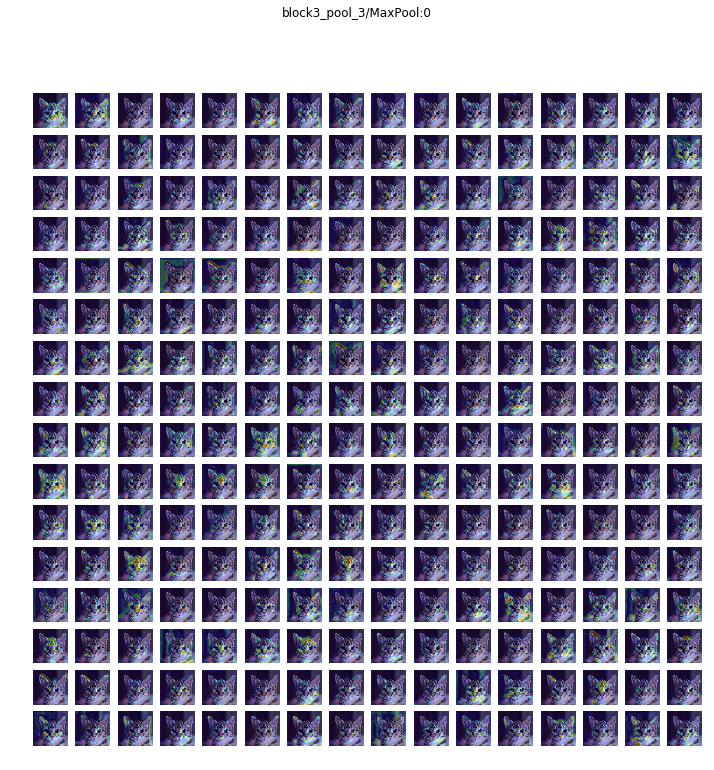

block4_conv1_3/Relu:0 (1, 28, 28, 512) 


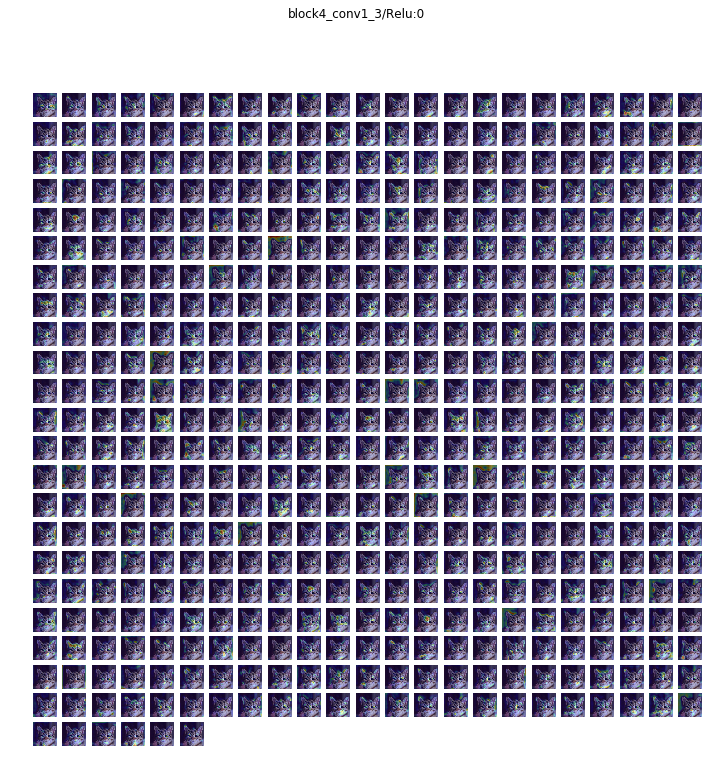

block4_conv2_3/Relu:0 (1, 28, 28, 512) 


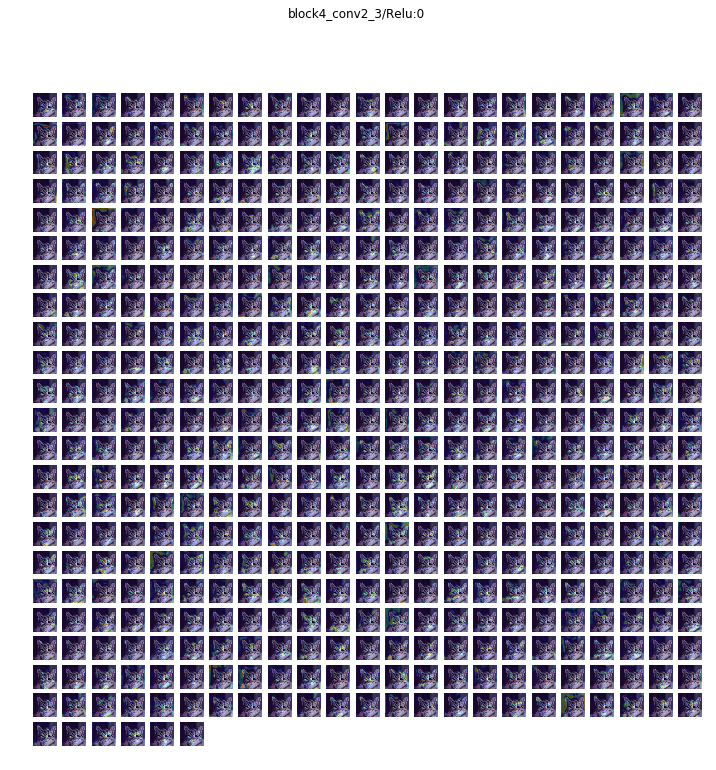

block4_conv3_3/Relu:0 (1, 28, 28, 512) 


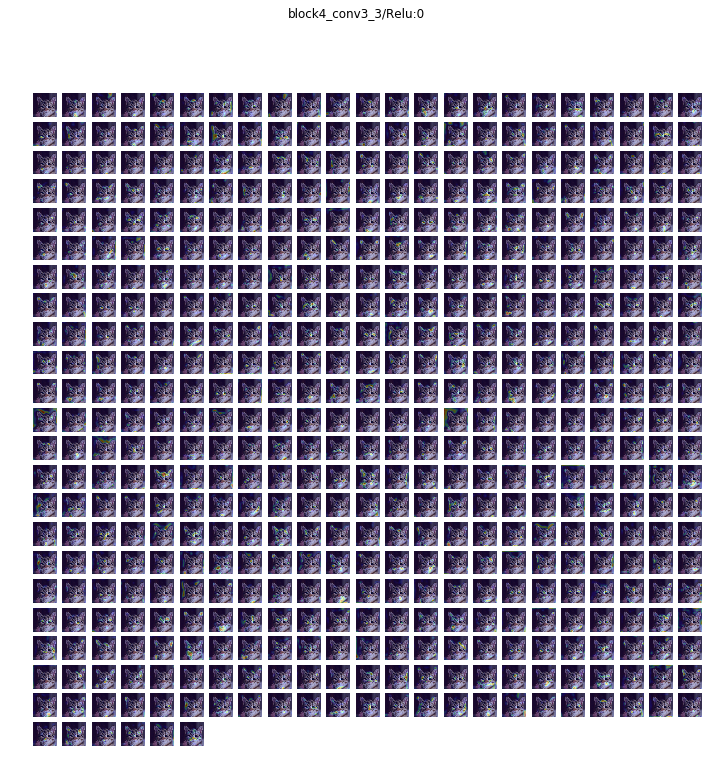

block4_pool_3/MaxPool:0 (1, 14, 14, 512) 


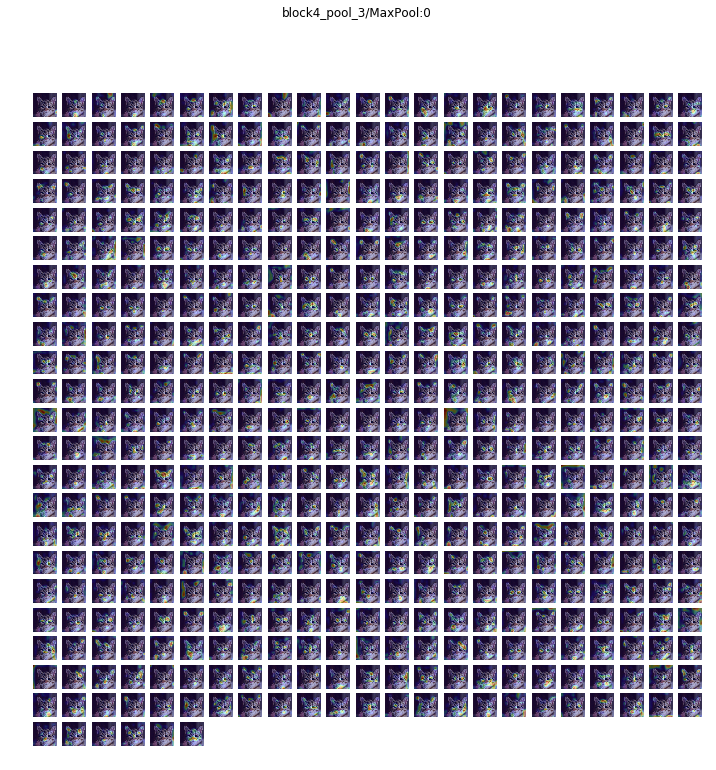

block5_conv1_3/Relu:0 (1, 14, 14, 512) 


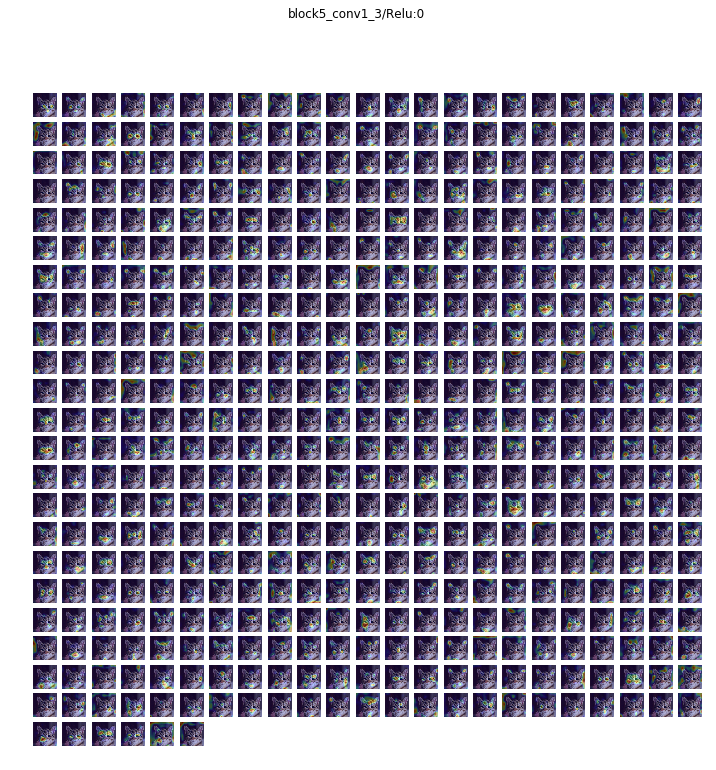

block5_conv2_3/Relu:0 (1, 14, 14, 512) 


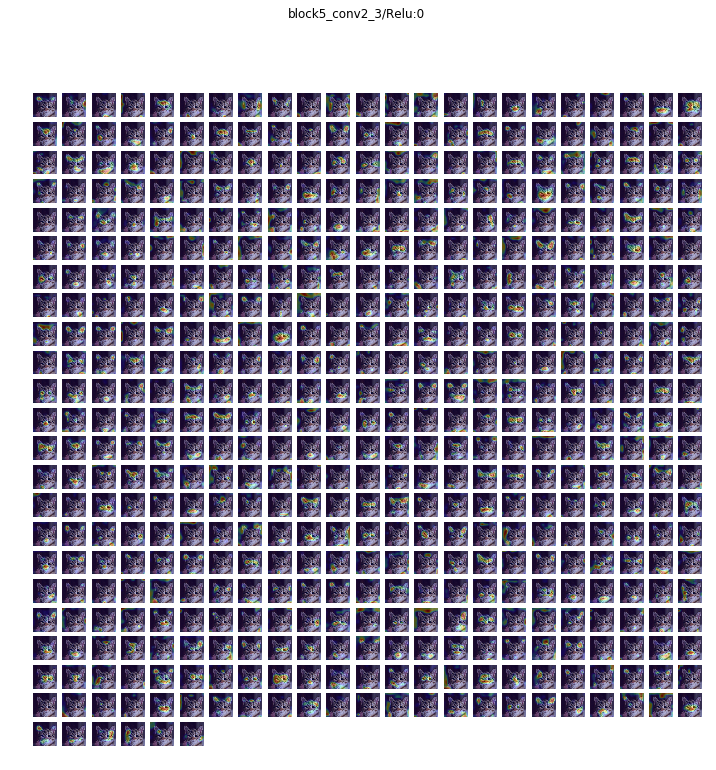

block5_conv3_3/Relu:0 (1, 14, 14, 512) 


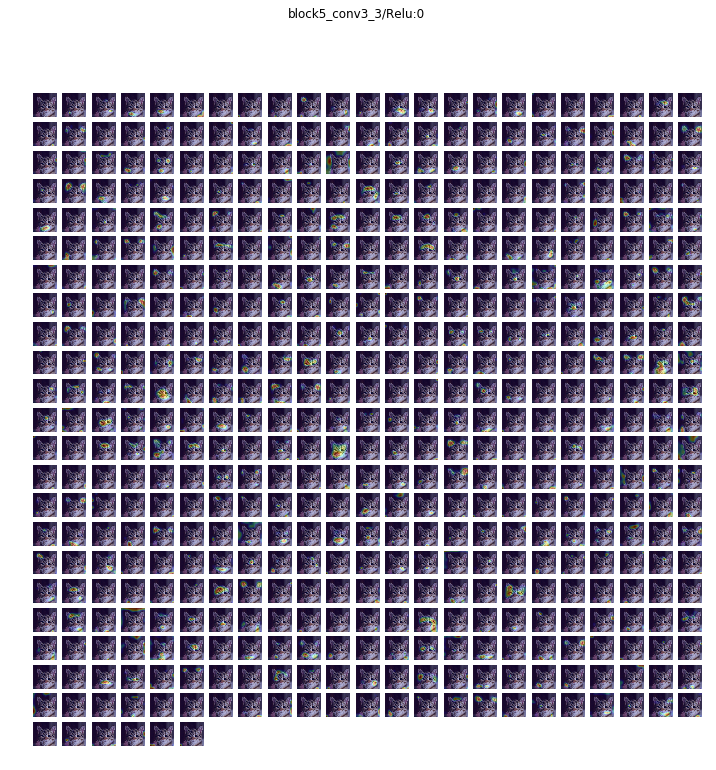

block5_pool_3/MaxPool:0 (1, 7, 7, 512) 


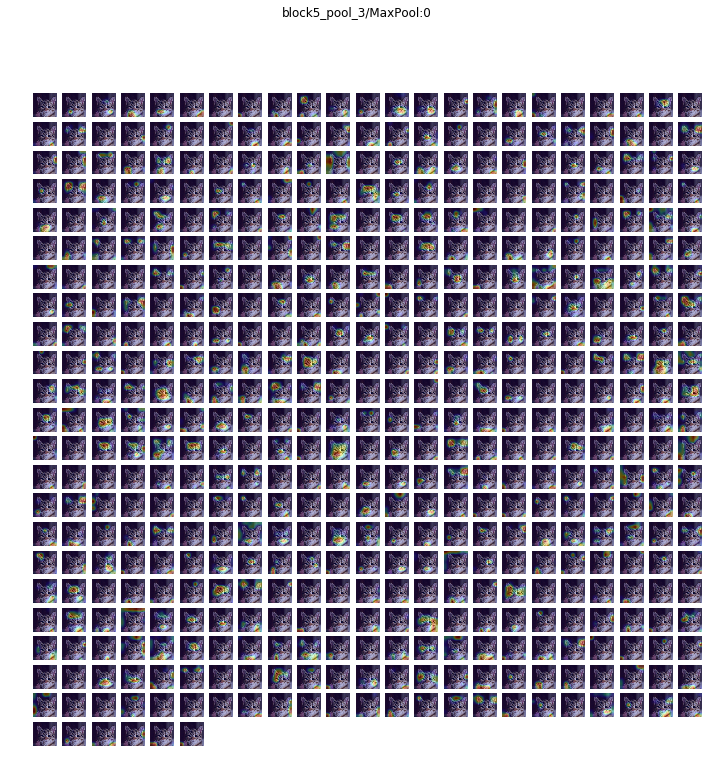

flatten_3/Reshape:0 (1, 25088) -> Skipped. 2D Activations.
fc1_3/Relu:0 (1, 4096) -> Skipped. 2D Activations.
fc2_3/Relu:0 (1, 4096) -> Skipped. 2D Activations.
predictions_3/Softmax:0 (1, 1000) -> Skipped. 2D Activations.


In [4]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import img_to_array

model = VGG16()

from PIL import Image
import requests
from io import BytesIO
import numpy as np

url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/1/14/Gatto_europeo4.jpg/250px-Gatto_europeo4.jpg'
response = requests.get(url)
image = Image.open(BytesIO(response.content))
image = image.crop((0, 0, 224, 224))
image = img_to_array(image)
arr_image = np.array(image)
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
image = preprocess_input(image)
yhat = model.predict(image)
label = decode_predictions(yhat)
label = label[0][0]
print('{} ({})'.format(label[1], label[2] * 100))

import keract

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
activations = keract.get_activations(model, image)
keract.display_heatmaps(activations, arr_image)